#Computer Vision assignment: Face alignment and colouring face landmarks

This notebook is split into three parts:
1. Initial setup: imports and data downloading
2. Face alignment: training a CNN and evaluating it
3. Colouring face landmarks: colouring in the lips and attempting to colour the eyes and the qualitative results of our methods

##1. Initial setup

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random

from skimage.feature import hog

import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten

import math
from PIL import Image, ImageEnhance
import imutils

import csv

!pip install cmapy
import cmapy

In [2]:
#!wget "http://users.sussex.ac.uk/~is321/training_images.npz" -O training_images.npz
!wget "https://sussex.box.com/shared/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz" -O training_images.npz

# The test images (without points)
#!wget "http://users.sussex.ac.uk/~is321/test_images.npz" -O test_images.npz
!wget "https://sussex.box.com/shared/static/xxlgvjpa86s6xgjzy5im06saoj57s7gt.npz" -O test_images.npz

# The example images are here
#!wget "http://users.sussex.ac.uk/~is321/examples.npz" -O examples.npz
!wget "https://sussex.box.com/shared/static/kbodelmaqw5dd59i5x2kis55lor7ydhf.npz" -O examples.npz

--2022-05-01 13:39:19--  https://sussex.box.com/shared/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Resolving sussex.box.com (sussex.box.com)... 185.235.236.197
Connecting to sussex.box.com (sussex.box.com)|185.235.236.197|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz [following]
--2022-05-01 13:39:20--  https://sussex.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Reusing existing connection to sussex.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://sussex.app.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz [following]
--2022-05-01 13:39:20--  https://sussex.app.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Resolving sussex.app.box.com (sussex.app.box.com)... 103.116.4.201
Connecting to sussex.app.box.com (sussex.app.box.com)|103.116.4.201|:443... connected.
HTTP request sent, awaiting response... 302 Found
Loca

In [3]:
def confirm_checksum(filename, true_checksum):
  import subprocess
  checksum = subprocess.check_output(['shasum',filename]).decode('utf-8')
  assert checksum.split(' ')[0] == true_checksum, 'Checksum does not match for ' + filename + ' redownload the data.'

confirm_checksum('training_images.npz', 'f313a54fc57a1235e6307d176fc5fc83fd7ec530')
confirm_checksum('test_images.npz', '4b9efd8eb3b87c07d9c5400ef2494d476bc318a3')
confirm_checksum('examples.npz', 'bf51ebbf42f17e3cbe06bb299746565c53d16c40')

Our data consists of 3 sets:
1. Training data, images and their ground truth points for face alignment.
2. Testing data, only images that do not have ground truth points that we'll make face alignment predictions on and submit for our model to be evaluated.
3. Example data, 6 varied images on which we'll make face alignment predictions and use for qualitative evaluation of our model on face alignment and face landmark colouring.

In [4]:
#Training data
train_data = np.load('training_images.npz', allow_pickle=True)
train_images = train_data['images']
train_points = train_data['points']
print('Shape of the training images:', train_images.shape)
print('Shape of their groundtruth points:', train_points.shape)
print('\n')

#Testing data
test_data = np.load('test_images.npz', allow_pickle=True)
test_images = test_data['images']
print('Shape of the training images:',test_images.shape)
print('\n')

#Example data
example_data = np.load('examples.npz', allow_pickle=True)
example_images = example_data['images']
print('Shape of our example images:', example_images.shape)

Shape of the training images: (2811, 244, 244, 3)
Shape of their groundtruth points: (2811, 42, 2)


Shape of the training images: (554, 244, 244, 3)


Shape of our example images: (6, 244, 244, 3)


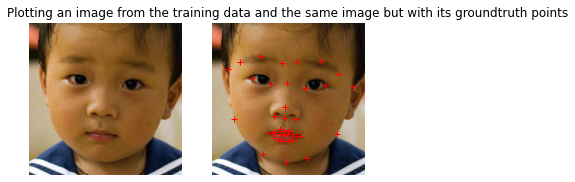

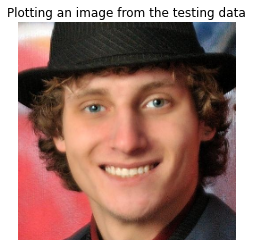

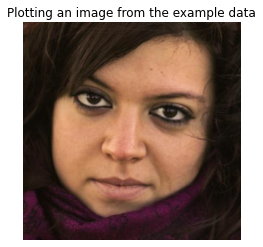

In [5]:
plt.subplot(121)
plt.imshow(train_images[55])
plt.axis('off')
plt.subplot(122)
plt.imshow(train_images[55])
plt.axis('off')
plt.plot(train_points[55][:,0],train_points[55][:,1],'+r')
plt.title('Plotting an image from the training data and the same image but with its groundtruth points')
plt.show()

plt.title('Plotting an image from the testing data')
plt.imshow(test_images[5])
plt.axis('off')
plt.show()

plt.title('Plotting an image from the example data')
plt.imshow(example_images[1])
plt.axis('off')
plt.show()

## 2. Face alignment

We decided to use Histogram of Oriented Gradients (HOG) features to train a Convolutional Neural Network. Here are the steps we chose for that:
1. Split the training data into two sets: one set of training data we'll use to train the CNN, and one evaluation set.
2. Augment the new set of training data.
3. Preprocess the augmented training dataset to get the HOG features and normalised points to train the CNN.
4. Build the CNN architecture and train it.
5. Evaluate the CNN quantitatively (on the evaluation set) and qualitatively (on the example images).
6. Compare our model to other models.

###2.1. Split training data into new training dataset and evaluation dataset

We need to keep a small fraction of our initial training set away from our model so it won't be trained on it, allowing us to evaluate it with images we do have the ground truth points for. We chose to keep only 85 images for evaluation as we want to maximise the data we have to train our model and ensure that our evaluation data is large enough to not risk being biased.

In [6]:
#This function splits the original data (with points) into:
  #1. A training set used to train the CNN models
  #2. A testing set used to evaluate the CNN models, never seen by the CNNs during training not even in the validation

def train_evaluation_split(images,points):
  # split the inputted images and points into our two new sets
  images_train, images_evaluation, pts_train, pts_evaluation = train_test_split(np.copy(images), np.copy(points), test_size=0.03, random_state=1)

  #zip our points and images of each dataset together
  train_set_list = list(zip(images_train,pts_train))
  evaluation_set_list = list(zip(images_evaluation,pts_evaluation))

  train_set = np.array(train_set_list,dtype='object')
  evaluation_set = np.array(evaluation_set_list,dtype='object')

  return train_set, evaluation_set

#we call the train set 'dataset' as it includes the train and validation set for the CNNs
train_data, evaluation_data = train_evaluation_split(train_images, train_points)

print("The dataset used to train the CNN has {} images with their groundtruth points.".format(train_data.shape[0]))
print("It will be evaluated on a testing set of {} images it has never seen during training.".format(evaluation_data.shape[0]))

The dataset used to train the CNN has 2726 images with their groundtruth points.
It will be evaluated on a testing set of 85 images it has never seen during training.


###2.2 Augmenting the training data

Our model will be more accurate if it has more training data (we prove this later on by training the same model with only the base data). To augment our data, many techniques are available, but we need to pick the ones that won't result in the same HOG feature image (it is invariant to geometric and photometric changes). This is because HOG features are good at excluding noise from an image. Our HOG feature extractor has 6x6 pixels per cell, this is because we found it provided the best accuracy for our model (which we also prove later on).

2.2.1 Increasing the brightness

We found the function to increase the brightness here: https://stackoverflow.com/questions/32609098/how-to-fast-change-image-brightness-with-python-opencv

In [83]:
# Function to increase the brightness of an image
# Input: the image and the integer value definning by how much we want to brighten it
# Output: the image brightened by the inputted value

def increase_brightness(img, value):
  hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  h, s, v = cv2.split(hsv)

  lim = 255 - value
  v[v > lim] = 255
  v[v <= lim] += value

  final_hsv = cv2.merge((h, s, v))
  img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
  return img

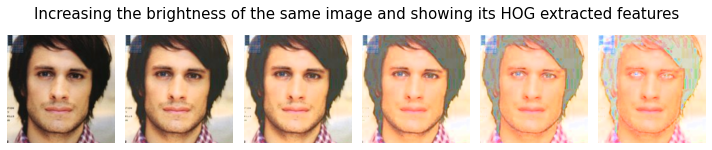

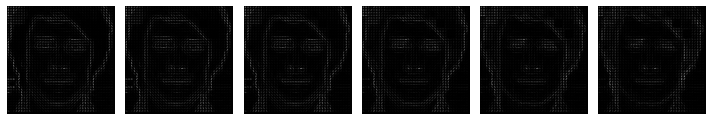

In [8]:
# Here we display a comparison of the same image brightened at different values and its corresponding HOG features
# The first row has the same image at different levels of brightness
# The second row has the HOG features of the image above it
# Note: the first image is not brightened at all, it is the original image

img = np.copy(train_data[130][0])
brightness_values = [0,25,50,100,150,200]

fig = plt.figure(figsize=(10, 10))
for i in range(len(brightness_values)):
  ax = fig.add_subplot(161+i)
  img_brightened = increase_brightness(img, brightness_values[i])
  ax.imshow(img_brightened)
  plt.axis('off')

fig.tight_layout()
fig.suptitle('Increasing the brightness of the same image and showing its HOG extracted features',y=0.615,fontsize=15)
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(brightness_values)):
  ax = fig.add_subplot(261+i)
  img_brightened = increase_brightness(img, brightness_values[i])
  fd, hog_image = hog(img_brightened, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
  ax.imshow(hog_image, cmap='gray')
  plt.axis('off')
fig.tight_layout()
plt.show()

As we can observe in our comparison, the changes in our HOG features images are too small to count as 'new data'. So we will not add images with increased brightness to our augmented data.

2.2.2 Decreasing the brightness

In [9]:
def decrease_brightness(img,value):
  img_arr = Image.fromarray(img)
  enhancer = ImageEnhance.Brightness(img_arr)
  img_arr = enhancer.enhance(value)
  return img_arr

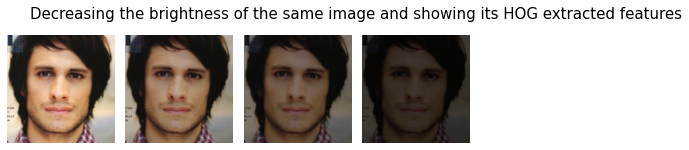

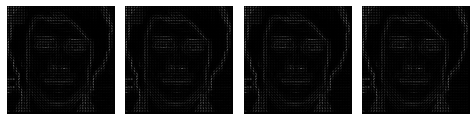

In [10]:
# Here we display a comparison of the same image with its brightness lowered at different values and its corresponding HOG features
# The first row has the same image at different levels of lowered brightness
# The second row has the HOG features of the image above it
# Note: the first image does not have its brightness lowered at all, it is the original image

img = np.copy(train_data[130][0])
brightness_values = [1,0.75, 0.5, 0.25]

fig = plt.figure(figsize=(10, 10))
for i in range(len(brightness_values)):
  ax = fig.add_subplot(161+i)
  img_unbrightened = decrease_brightness(img, brightness_values[i])
  ax.imshow(img_unbrightened)
  plt.axis('off')

fig.tight_layout()
fig.suptitle('Decreasing the brightness of the same image and showing its HOG extracted features',y=0.615,fontsize=15)
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(brightness_values)):
  ax = fig.add_subplot(261+i)
  img_unbrightened = decrease_brightness(img, brightness_values[i])
  fd, hog_image = hog(img_unbrightened, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
  ax.imshow(hog_image, cmap='gray')
  plt.axis('off')
fig.tight_layout()
plt.show()

This is a little trivial seeing the results of the previous section on augmenting the brightness. Since there isn't any change in the HOG features of images with lower brightness, we won't include them in our augmented data.

2.2.3 Rotating the image

In [11]:
def rotate_image_and_points(img, pts, value):

  #rotate the img
  rotated_img = imutils.rotate(img,angle=value)

  #rotate the pts
  rotated_pts = []
  for i in range(42):
    radians = np.deg2rad(value)

    x = pts[i][0]
    y = pts[i][1]
    ox = 122
    oy = 122

    qx = ox + math.cos(radians) * (x - ox) + math.sin(radians) * (y - oy)
    qy = oy + -math.sin(radians) * (x - ox) + math.cos(radians) * (y - oy)

    rotated_pts.append(np.array([qx,qy]))

  rotated_pts = np.array(rotated_pts)

  return rotated_img,rotated_pts

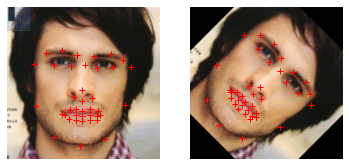

In [12]:
# Demonstration of the function
img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])

plt.title('Demo of rotating function that rotates the image and the points')

plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.plot(pts[:,0],pts[:,1],'+r')

plt.subplot(122)
img_rotated, pts_rotated = rotate_image_and_points(img, pts, -45)
plt.imshow(img_rotated)
plt.axis('off')
plt.plot(pts_rotated[:,0],pts_rotated[:,1],'+r')

plt.show()

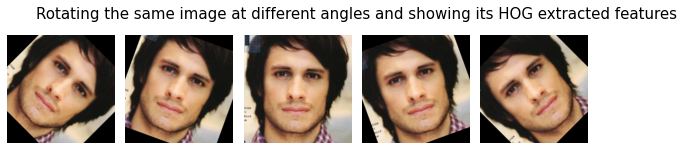

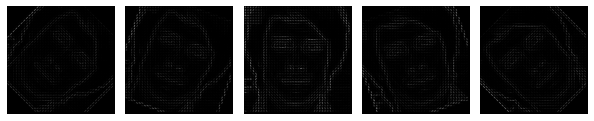

In [13]:
# Here we display a comparison of the same image rotated at different values and its corresponding HOG features
# The first row has the same image at different rotated angles
# The second row has the HOG features of the image above it
# Note: the third image is not rotated at all

img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])
rotation_values = [-45,-20, 0, 20, 45]

fig = plt.figure(figsize=(10, 10))
for i in range(len(rotation_values)):
  ax = fig.add_subplot(161+i)
  img_rotated, pts_rotated = rotate_image_and_points(img, pts, rotation_values[i])
  ax.imshow(img_rotated)
  plt.axis('off')

fig.tight_layout()
fig.suptitle('Rotating the same image at different angles and showing its HOG extracted features',y=0.615,fontsize=15)
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(rotation_values)):
  ax = fig.add_subplot(261+i)
  img_rotated, pts_rotated = rotate_image_and_points(img, pts, rotation_values[i])
  fd, hog_image = hog(img_rotated, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
  ax.imshow(hog_image, cmap='gray')
  plt.axis('off')
fig.tight_layout()
plt.show()

In this case, the HOG features do change (they are at different angles) so we will include this method in the augmented data. We will only rotate our images from -45 to +45 degrees as our data does not (or very rarely has) faces that are at an angle more than 45 degrees.

2.2.4 Flipping the image horizontally

In [14]:
def flip_image_and_points(img,pts):
  img_flipped = cv2.flip(img,1)

  pts_flipped = []
  for i in range(42):
    x = 244 - pts[i][0]
    y = pts[i][1]
    pts_flipped.append(np.array([x,y]))

  pts_flipped = np.array(pts_flipped)

  return img_flipped,pts_flipped

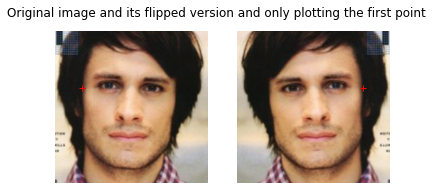

In [15]:
# Demonstration of the flip function and why it does not work for our model

img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])

plt.suptitle('Original image and its flipped version and only plotting the first point',y=0.85)

plt.subplot(121)
plt.axis('off')
plt.imshow(img)
plt.plot(pts[:,0][0],pts[:,1][0],'+r')

plt.subplot(122)
img_flipped, pts_flipped = flip_image_and_points(img,pts)
plt.axis('off')
plt.imshow(img_flipped)
plt.plot(pts_flipped[:,0][0],pts_flipped[:,1][0],'+r')

plt.show()

As we can observe, the first point has its x coordinates flipped on the flipped image. This does not work for our model as we need the first point to always represent the upper left side of the face. Otherwise, our model will learn that the first point can be either on the left or right side, which will make our predictions converge in the middle.

We attempted to solve this issue by reversing the order of the points on the flipped image but it did not function as the points are not in a symmetrical order (the first point is the point on the upper left side of the face but the last point is not the point on the upper right side of the face). There might be a way to get the points in the right order but we were unable to find it with our experimentations.

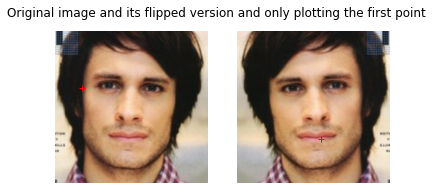

In [16]:
# Demonstration of our attempted fix on the flipped points

img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])

plt.suptitle('Original image and its flipped version and only plotting the first point',y=0.85)

plt.subplot(121)
plt.axis('off')
plt.imshow(img)
plt.plot(pts[:,0][0],pts[:,1][0],'+r')


plt.subplot(122)
img_flipped, pts_flipped = flip_image_and_points(img,pts)

pts_flipped = np.flip(pts_flipped,0) #reversing the order of the flipped points

plt.axis('off')
plt.imshow(img_flipped)
plt.plot(pts_flipped[:,0][0],pts_flipped[:,1][0],'+r')

plt.show()

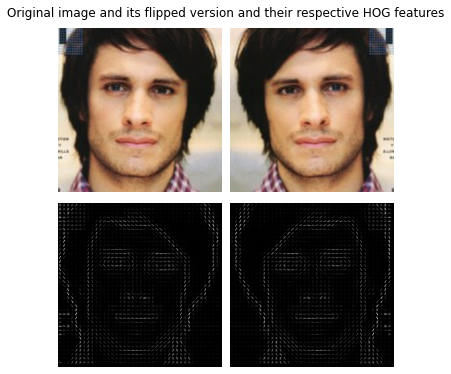

In [17]:
# Here we display a comparison of the same image and its flipped version and its corresponding HOG features
# The first row has the same image and its flipped version
# The second row has the HOG features of the image above it

img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])

fig = plt.figure(figsize=(5, 5))

plt.suptitle('Original image and its flipped version and their respective HOG features',y=1.03)

plt.subplot(221)
plt.axis('off')
plt.imshow(img)

plt.subplot(222)
img_flipped, pts_flipped = flip_image_and_points(img,pts)
plt.axis('off')
plt.imshow(img_flipped)

plt.subplot(223)
fd, hog_image = hog(img, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
plt.axis('off')
plt.imshow(hog_image, cmap='gray')

plt.subplot(224)
fd, hog_image = hog(img_flipped, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
plt.axis('off')
plt.imshow(hog_image, cmap='gray')

fig.tight_layout()
plt.show()

Here, if our flip function provided a valid set of ground truth points, we would have included this method to make some augmented data as the HOG images are different.

Note: there is no need to flip the image vertically as making our model robust for images of upside-down faces is not useful since we haven't encountered any in our training, testing and example images. This is not to say we should never train a model for cases we may never see, but for our case here, seeing the test images we'll be evaluated on, our model may perform worse on them if we do include vertically flipped images.

2.2.5 Adding noise

In [18]:
def noise_image(img,value):
  mean = 0
  var = value
  sigma = var**0.5
  gauss = np.random.normal(mean,sigma,(img.shape))
  noisy = img + gauss
  return noisy.astype(np.uint8)

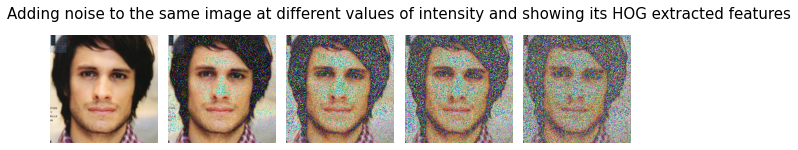

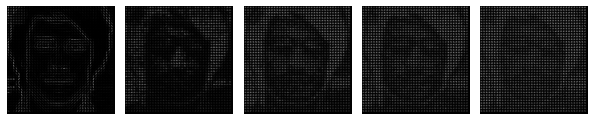

In [19]:
# Here we display a comparison of the same image with different values of random noise and its corresponding HOG features
# The first row has the same image at different values of random noise
# The second row has the HOG features of the image above it
# Note: the first image has no noise added to it

img = np.copy(train_data[130][0])
pts = np.copy(train_data[130][1])
noise_values = [0, 250, 1000, 1500, 2500]

fig = plt.figure(figsize=(10, 10))
for i in range(len(noise_values)):
  ax = fig.add_subplot(161+i)
  img_noised = noise_image(img, noise_values[i])
  ax.imshow(img_noised)
  plt.axis('off')

fig.tight_layout()
fig.suptitle('Adding noise to the same image at different values of intensity and showing its HOG extracted features',y=0.615,fontsize=15)
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(noise_values)):
  ax = fig.add_subplot(261+i)
  img_noised = noise_image(img, noise_values[i])
  fd, hog_image = hog(img_noised, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), visualize=True, multichannel=True)
  ax.imshow(hog_image, cmap='gray')
  plt.axis('off')
fig.tight_layout()
plt.show()

As we can observe, adding noise to the image does change its HOG feature extracted image. Therefore, we can include these augmented images in our training data.

2.2.6 Function to generate augmented data

In [20]:
def augment_data(dataset):

  dataset_augmented = []

  for i in range(len(dataset)):

    #append the original image and its points
    img_ori = np.copy(dataset[i][0])
    pts_ori = np.copy(dataset[i][1])

    dataset_augmented.append(np.array([img_ori,pts_ori],dtype='object'))

    #rotate
    rotation_nums = [-20,-10,10,20]
    for i in rotation_nums:
      img_rotated,pts_rotated = rotate_image_and_points(img_ori,pts_ori,i)
      dataset_augmented.append(np.array([img_rotated,pts_rotated],dtype='object'))

    #add noise
    noise_nums =  [250, 1000, 1500]
    for i in noise_nums:
      img_noised = noise_image(img_ori,i)
      dataset_augmented.append(np.array([img_noised,pts_ori],dtype='object'))

  dataset_augmented = np.array(dataset_augmented)

  return dataset_augmented

In [21]:
# Here we generate the augmented dataset from our train_data

print('In our original training set we have {} images.'.format(len(train_data)))

train_data_augmented = augment_data(train_data)

print('In our augmented dataset, we have {} images.'.format(len(train_data_augmented)))

In our original training set we have 2726 images.
In our augmented dataset, we have 21808 images.


###2.3 Preprocessing the data and collecting HOG features

Preprocessing our data has 3 important steps: resizing, getting HOG features, and normalising.

2.3.1 Resizing

We have to resize our images because they are originally 244 pixels and wide and 244 pixels high (244x244) which is too much for our current GPU RAM capacity. Therefore, we resize our images to half of their original size: 122x122, effectively also slighlty dilating our HOG features.

The function also resized the points (by dividing them by half) to make sure they are still accurate to be plotted on our data but this does not actually matter for our CNN.

In [22]:
def resize_244_to_122(img,pts=None):
  img = cv2.resize(img,dsize=(122,122))
  if pts is None:
    return img
  else:
    pts = np.array(pts.reshape([-1])/2).astype('float32')
    return img, pts

2.3.2 Getting HOG features

Getting the Histogram of Oriented Gradients on each of our images has already been demonstrated above, but there are some parameters in our method that we chose and that we will explain here. These concern resizing the image and choosing the right number of pixels per cell for our HOG extractor.

In [23]:
def get_HOG_features(img, PPC=6):
  fd, img  = hog(img, orientations=9, pixels_per_cell=(PPC, PPC),cells_per_block=(2, 2), visualize=True, multichannel=True)
  return img

We resize the images for RAM storage and GPU RAM capabilities, and this does affect the HOG features. We found that it has a dilation effect on the HOG features and there are many less details on the resized image. This is why later on, we experiment with the right number of Pixels Per Cell (PPC) for our HOG features on our resized image to maximise our CNN's accuracy on the evaluation set.

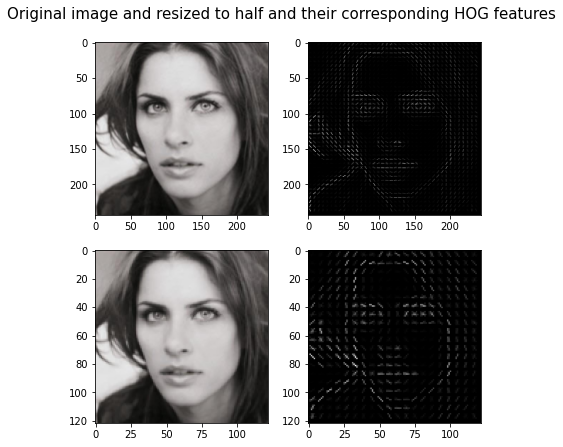

In [24]:
fig = plt.figure(figsize=(7, 7))
fig.suptitle('Original image and resized to half and their corresponding HOG features',y=0.95,fontsize=15)

img_original_size = np.copy(train_data_augmented[0][0])
plt.subplot(221)
plt.imshow(img_original_size)

img_original_size_HOG = get_HOG_features(img_original_size)
plt.subplot(222)
plt.imshow(img_original_size_HOG, cmap='gray')

img_resized,pts_resized = resize_244_to_122(img_original_size, train_data_augmented[0][1])
plt.subplot(223)
plt.imshow(img_resized)

img_resized_HOG = get_HOG_features(img_resized)
plt.subplot(224)
plt.imshow(img_resized_HOG, cmap='gray')
           
plt.show()

Here we demonstrate, on a resized image, the effect of HOG features with different numbers of pixels per cell. We will find that on most, the face features (eyes, nose, mouth, contour) is very visible and the noise around it is ignored.

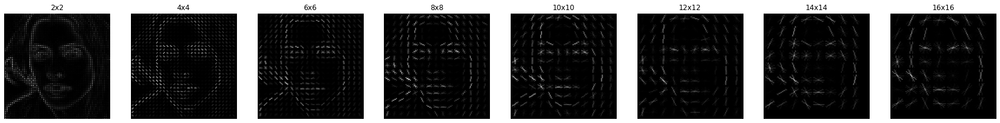

In [84]:
PPC_values = [2,4,6,8,10,12,14,16]
img = np.copy(train_data_augmented[0][0])
pts = np.copy(train_data_augmented[0][1])
img_resized, pts_resized = resize_244_to_122(img, pts)

fig = plt.figure(figsize=(30, 30))
for i in range(len(PPC_values)):
  plt.subplot(181 + i)
  title = str(PPC_values[i]) + 'x' + str(PPC_values[i])
  plt.gca().set_title(title)

  HOG_img = get_HOG_features(img_resized, PPC=PPC_values[i])
  plt.axis('off')
  plt.imshow(HOG_img,cmap='gray')

plt.show()

2.3.3 Normalising images and points

Normalising our data puts it all on the same order of magnitude.

In [26]:
def normalise_image_and_points(img,pts=None):
  img_norm = img / 255.0
  if pts is None:
    return img_norm
  else:
    pts_norm = pts / 122.0 #divided by the value that we resized to earlier
    return img_norm, pts_norm

2.3.4 Function to preprocess the dataset

In [27]:
def preprocess_data(dataset):
  preprocessed_data = []

  for i in range(len(dataset)):
    if i % 500 == 0: print(str(i) + '/' + str(len(dataset))) #to keep track of progress

    img = np.copy(dataset[i][0])
    pts = np.copy(dataset[i][1])

    #resize the image
    img_resized, pts_resized = resize_244_to_122(img,pts)

    #get the HOG features
    img_HOG = get_HOG_features(img_resized)

    #normalize
    img_norm, pts_norm = normalise_image_and_points(img_HOG, pts_resized)

    #add to new dataset
    preprocessed_data.append(np.array([img_norm,pts_norm],dtype='object'))
  
  return preprocessed_data

In [28]:
# This function does the same as the one that preprocesses the dataset but can be used to only preprocess 1 image and not its points
# This will be useful when we will need to make predictions
def preprocess_image(img):
  img = np.copy(img)
  img_resized = resize_244_to_122(img)
  img_HOG = get_HOG_features(img_resized)
  img_norm = normalise_image_and_points(img_HOG)
  return img_norm

In [29]:
print('Preprocessing images and points...')
train_data_augmented_preprocessed = preprocess_data(train_data_augmented)
print('Finished preprocessing!')

Preprocessing images and points...
0/21808
500/21808
1000/21808
1500/21808
2000/21808
2500/21808
3000/21808
3500/21808
4000/21808
4500/21808
5000/21808
5500/21808
6000/21808
6500/21808
7000/21808
7500/21808
8000/21808
8500/21808
9000/21808
9500/21808
10000/21808
10500/21808
11000/21808
11500/21808
12000/21808
12500/21808
13000/21808
13500/21808
14000/21808
14500/21808
15000/21808
15500/21808
16000/21808
16500/21808
17000/21808
17500/21808
18000/21808
18500/21808
19000/21808
19500/21808
20000/21808
20500/21808
21000/21808
21500/21808
Finished preprocessing!


### 2.4 Building the CNN and training it

This section will have the following steps:
1. Split training data into training and validation
2. Building the architecture of our CNN
3. Training our CNN
4. Evaluating our CNN

2.4.1 Splitting data for training and validation

To train a Convolutional Neural Network for a regression task, we need to split our training data into two sets: one for training and one for validation. This permits seeing if our model starts overfitting and steering away from having good weights.

In [30]:
# This function takes a dataset (in our case our training augmented and preprocessed data) and separates it into 4 sets
# The training images, the validation images, training points, the validation points

def training_validation_split(training_data):

  #First split the dataset images and dataset points into two different arrays
  dataset_imgs = [i[0] for i in training_data] #X
  dataset_pts = [i[1] for i in training_data] #Y

  #Second split with train_test_split function
  images_train, images_val, points_train, points_val = train_test_split(dataset_imgs,dataset_pts,test_size=0.004,random_state=1)

  #Make the type numpy arrays as that's what TensorFlow prefers
  images_train = np.array(images_train)
  images_val = np.array(images_val)
  points_train = np.array(points_train)
  points_val = np.array(points_val)

  return images_train, images_val, points_train, points_val

In [31]:
print('Our training augmented and processed data has {} images.'.format(len(train_data_augmented_preprocessed)))

images_train, images_val, points_train, points_val = training_validation_split(train_data_augmented_preprocessed)
print('Our CNN has {} images to train with.'.format(len(images_train)))
print('Our CNN has {} images to validate itself with.'.format(len(images_val)))

Our training augmented and processed data has 21808 images.
Our CNN has 21720 images to train with.
Our CNN has 88 images to validate itself with.


We also need to define our data in to data generators to avoid using too much ram. If we load our data straight into our CNN, our notebook's RAM will saturate. But if we input a generator with our images, the generator will give the CNN the images as it needs it per epoch.

The code for the generators comes from this website:
https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

In [32]:
import numpy as np
import keras
from keras.preprocessing.image import ImageDataGenerator

class DataGenerator(keras.utils.all_utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=1,
                 n_classes=10, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size), dtype=int)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = np.load('data/' + ID + '.npy')

            # Store class
            y[i] = self.labels[ID]

        return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

In [33]:
# Creating our generators from our split training and validation data
images_train = np.expand_dims(images_train,axis=-1)
images_val = np.expand_dims(images_val, axis=-1)

train_datagenerator = ImageDataGenerator()
train_generator = train_datagenerator.flow(x = images_train, y = points_train, batch_size=128, shuffle=True)

validation_datagenerator = ImageDataGenerator()
validation_generator = validation_datagenerator.flow(x = images_val, y = points_val, batch_size=128)

2.4.2 Convolutional Neural Network (CNN) architecture

The input layer and output layer of our CNN are known:
- the input layer needs to intake a 122x122 image with 1 colour layer
- the output layer needs to output 84 points that represent our 42 points (defined by their x and y coordinates)

However, the number of hidden layers and their hyperparameters were found through experimentation. We found that the deeper we made our CNN, the more accurate it got. This means we increased the number of nodes and the number of layers until our GPU RAM power availability was maximised.

We chose the ReLU activation function on all of our layers (except the last one as we found through experimentation that having it be sigmoid made our model more accurate) as the points we want to predict are always positive and linear.

In [34]:
def build_CNN():
  model = Sequential()
  
  model.add(Conv2D(128, (3, 3), padding = 'same', activation='relu', input_shape=(122, 122, 1)))

  model.add(MaxPool2D(pool_size=(2, 2)))

  model.add(Dropout(0.25))
  model.add(Flatten())
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.25))
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.25))
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.5))
  model.add(Dense(84, activation='sigmoid'))

  model.compile(loss='mean_squared_error', optimizer='adam')

  return model

In [35]:
CNN_model = build_CNN()

2.4.3 Training our CNN

In [36]:
def train_CNN(model, train_generator, val_generator, num_epochs=10):
  print('Training the model...')

  model.fit(train_generator, batch_size=128, epochs=num_epochs, validation_data = validation_generator, verbose = 1)
  print('Model trained!')

  return model

In [37]:
#Training the CNN
CNN_model = train_CNN(CNN_model, train_generator, validation_generator, num_epochs=100)

Training the model...
Epoch 1/100
170/170 [==============================] - 32s 136ms/step - loss: 0.0051 - val_loss: 0.0011
Epoch 2/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0017 - val_loss: 9.3907e-04
Epoch 3/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0013 - val_loss: 7.4191e-04
Epoch 4/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0011 - val_loss: 7.0362e-04
Epoch 5/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0010 - val_loss: 6.6047e-04
Epoch 6/100
170/170 [==============================] - 23s 133ms/step - loss: 9.4023e-04 - val_loss: 5.8342e-04
Epoch 7/100
170/170 [==============================] - 23s 133ms/step - loss: 8.8028e-04 - val_loss: 5.8366e-04
Epoch 8/100
170/170 [==============================] - 23s 133ms/step - loss: 8.3160e-04 - val_loss: 5.7038e-04
Epoch 9/100
170/170 [==============================] - 23s 133ms/step - loss: 7.9257e-04 - val_loss: 5.519

2.5 Evaluating our CNN

There are three ways to evaluate our CNN:
- quantitatively by making predictions with our CNN model on the evaluation set and calculating how close the predicted points are to the ground truth points,
- qualitatively by making predictions with our CNN model on the evaluation set and plotting them on some of the images to observe how it performs.
- quantitatively against other models

In [38]:
def get_predictions(img, model):
  #first preprocess the image
  img_preprocessed = preprocess_image(img)

  #then make the predictions with the model
  predictions = np.squeeze(model.predict(np.expand_dims(img_preprocessed,axis=0)))

  #multiply the predictions by 244 to put them back to their original size
  predictions = predictions * 244

  return predictions

In [39]:
# Making predictions on the test images and saving our results as a CSV

def save_as_csv(points, location = '.'):
    """
    Save the points out as a .csv file
    :param points: numpy array of shape (no_test_images, no_points, 2) to be saved
    :param location: Directory to save results.csv in. Default to current working directory
    """
    assert points.shape[0]==554, 'wrong number of image points, should be 554 test images'
    assert np.prod(points.shape[1:])==2*42, 'wrong number of points provided. There should be 42 points with 2 values (x,y) per point'
    np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')

points = []
for i in range(len(test_images)):
  points.append(get_predictions(test_images[i],CNN_model))
points = np.array(points)

save_as_csv(points)

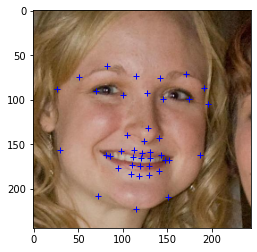

In [40]:
#Demonstration of using the get_predictions function
img = evaluation_data[0][0]
predictions = get_predictions(img,CNN_model)

plt.imshow(img)
plt.plot(predictions[0::2],predictions[1::2],'+b')
plt.show()

2.5.1 Quantitative analysis

This analysis will measure the average distance between the prediction points and the ground truth points on the 244x244 images. The distance used here is the euclidean distance.

In [41]:
#This function returns the average euclidean distance between two sets of points

def get_avg_euclid_dist(first_pts, second_pts):
  first_pts = np.reshape(first_pts, (-1, 2))
  second_pts = np.reshape(second_pts, (-1, 2))
  return np.average(np.sqrt(np.sum(np.square(first_pts - second_pts), axis=-1)))

In [85]:
#This function takes a dataset of images and their groundtruth points and a model to predict the points
#Then the average euclidean distance is returned

def evaluate_dataset(dataset, model):
  images = dataset[:,0]
  pts_gt = dataset[:,1]

  avg_euclid_dist = 0
  for i in range(len(images)):
    # get the predictions on the image
    predictions = get_predictions(images[i],model)

    #get the average euclid distance between prediction and groundtruth
    euclid_dist = get_avg_euclid_dist(predictions,pts_gt[i])

    #add it to the sum
    avg_euclid_dist += euclid_dist
  
  avg_euclid_dist = avg_euclid_dist / len(images)

  return avg_euclid_dist

In [43]:
evaluation_dataset_result = evaluate_dataset(evaluation_data,CNN_model)
print('Our CNN model has an average euclidean distance of {} on our {} evaluation images.'.format(evaluation_dataset_result,len(evaluation_data)))

Our CNN model has an average euclidean distance of 4.975087997172827 on our 85 evaluation images.


2.5.2 Qualitative analysis

In this section, we will simply plot the predicted and ground truth points on the evaluation images to observe how they perform.

In the first part, we are plotting our model's predictions on the first 6 images.

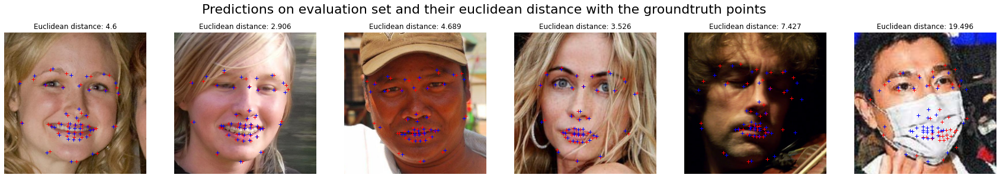

In [44]:
fig = plt.figure(figsize=(30, 30))
plt.suptitle('Predictions on evaluation set and their euclidean distance with the groundtruth points',y=0.58,fontsize=22)

for i in range(6):
  plt.subplot(161+i)
  plt.imshow(evaluation_data[i][0])
  plt.plot(evaluation_data[i][1][:,0],evaluation_data[i][1][:,1],'+r')
  predictions = get_predictions(evaluation_data[i][0],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'+b')

  avg_euclid_dist = get_avg_euclid_dist(evaluation_data[i][1],predictions)
  title = 'Euclidean distance: ' + str(round(avg_euclid_dist,3))
  plt.gca().set_title(title)
  plt.axis('off')
  
plt.show()

Observing the points on the 6 faces above, the results are best on the frontal facing images and worst on the darker (5th image) and obstructed image (6th image with the mask).

We will now observe the worst predictions our model made to see where it fails the most (this is measured as where the euclidean distance from that image was the furthest).

In [45]:
#Make the predictions and store them in a list
evaluation_dataset_individual_ed = [get_avg_euclid_dist(get_predictions(img,CNN_model),pts_gt) for img,pts_gt in evaluation_data]

In [46]:
#Zip the euclidean distances found and the evaluation data
evaluation_data_zip_ed = list(zip(evaluation_dataset_individual_ed,evaluation_data[:,0],evaluation_data[:,1]))

#Sort ascending
evaluation_data_zip_ed_sorted = sorted(evaluation_data_zip_ed)

#Sort descending
evaluation_data_zip_ed_sorted_reverse = sorted(evaluation_data_zip_ed,reverse=True)

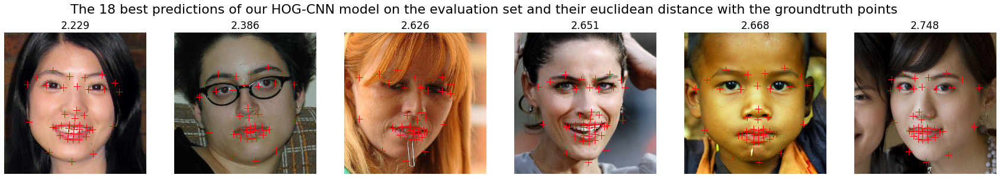

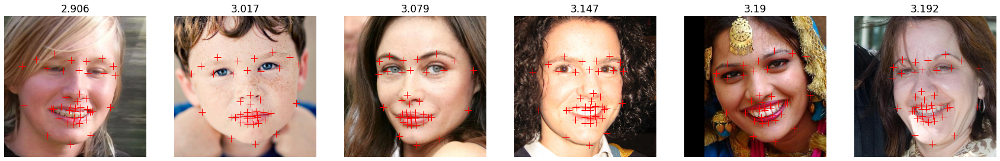

In [47]:
#Plot the 6 best
fig = plt.figure(figsize=(30, 30))
plt.suptitle('The 18 best predictions of our HOG-CNN model on the evaluation set and their euclidean distance with the groundtruth points',y=0.58,fontsize=22)

for i in range(6):
  plt.subplot(1,6,1+i)
  plt.imshow(evaluation_data_zip_ed_sorted[i][1])

  #plt.plot(evaluation_data_zip_ed_sorted[i][2][:,0],evaluation_data_zip_ed_sorted[i][2][:,1],'+r')
  
  predictions = get_predictions(evaluation_data_zip_ed_sorted[i][1],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'+r', markersize=12)

  avg_euclid_dist = get_avg_euclid_dist(evaluation_data_zip_ed_sorted[i][2],predictions)
  title = str(round(avg_euclid_dist,3))
  plt.gca().set_title(title,fontsize=17)
  plt.axis('off')
plt.show()

fig = plt.figure(figsize=(30, 30))
for i in range(6,12):
  plt.subplot(1,6,1+(i-6))
  plt.imshow(evaluation_data_zip_ed_sorted[i][1])

  #plt.plot(evaluation_data_zip_ed_sorted[i][2][:,0],evaluation_data_zip_ed_sorted[i][2][:,1],'+r')
  
  predictions = get_predictions(evaluation_data_zip_ed_sorted[i][1],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'+r', markersize=12)

  avg_euclid_dist = get_avg_euclid_dist(evaluation_data_zip_ed_sorted[i][2],predictions)
  title = str(round(avg_euclid_dist,3))
  plt.gca().set_title(title,fontsize=17)
  plt.axis('off')
plt.show()

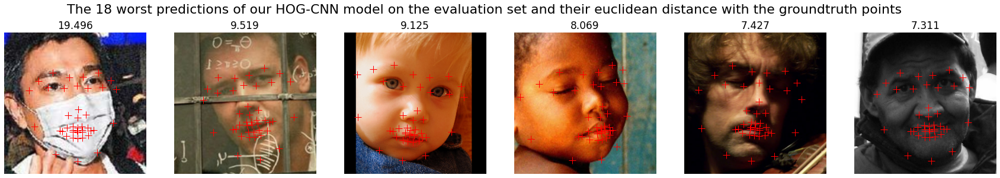

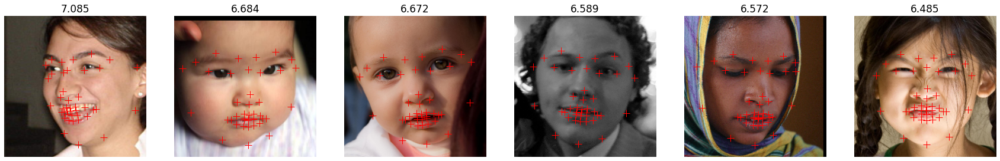

In [48]:
#Plot the 6 worst
fig = plt.figure(figsize=(30, 30))
plt.suptitle('The 18 worst predictions of our HOG-CNN model on the evaluation set and their euclidean distance with the groundtruth points',y=0.58,fontsize=22)

for i in range(6):
  plt.subplot(161+i)
  plt.imshow(evaluation_data_zip_ed_sorted_reverse[i][1])

  #plt.plot(evaluation_data_zip_ed_sorted_reverse[i][2][:,0],evaluation_data_zip_ed_sorted_reverse[i][2][:,1],'+r')
  
  predictions = get_predictions(evaluation_data_zip_ed_sorted_reverse[i][1],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'+r', markersize=12)

  avg_euclid_dist = get_avg_euclid_dist(evaluation_data_zip_ed_sorted_reverse[i][2],predictions)
  title = str(round(avg_euclid_dist,3))
  plt.gca().set_title(title,fontsize=17)
  plt.axis('off')
plt.show()

fig = plt.figure(figsize=(30, 30))
for i in range(6,12):
  plt.subplot(161+(i-6))
  plt.imshow(evaluation_data_zip_ed_sorted_reverse[i][1])

  #plt.plot(evaluation_data_zip_ed_sorted_reverse[i][2][:,0],evaluation_data_zip_ed_sorted_reverse[i][2][:,1],'+r')
  
  predictions = get_predictions(evaluation_data_zip_ed_sorted_reverse[i][1],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'+r', markersize=12)

  avg_euclid_dist = get_avg_euclid_dist(evaluation_data_zip_ed_sorted_reverse[i][2],predictions)
  title = str(round(avg_euclid_dist,3))
  plt.gca().set_title(title,fontsize=17)
  plt.axis('off')
plt.show()

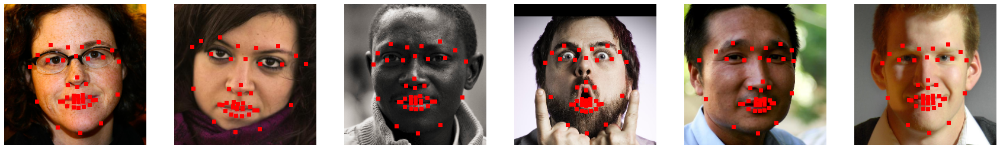

In [49]:
#Plot the 6 example images
fig = plt.figure(figsize=(30, 30))
#plt.suptitle('The 6 predictions on the example set',y=0.58,fontsize=22)

for i in range(6):
  plt.subplot(1,6,1+i)
  plt.imshow(example_images[i])
  
  predictions = get_predictions(example_images[i],CNN_model)
  plt.plot(predictions[0::2],predictions[1::2],'sr')

  plt.axis('off')

#plt.savefig("myImage.png", format="png", dpi=2400) 
plt.show()

2.6 Comparing our HOG-CNN model to other models

2.6.1 Comparing our model to other strategies

We will compare our HOG-CNN model to a simple CNN on resized grayscale images and a coarse-to-fine regression model. In a different notebook, we've built a coarse-to-fine CNN regression model that consists of one CNN that makes the initial predictions for the 42 points, then 42 CNNs that use these predictions to each predict 1 point (2 coordinates).

We will compare the performances of these models with a Cumulative Density Plot (CDP) and Box Plot (BP) that plots the results of the predictions on the same 85 evaluation images.

In this notebook, we imported the results of our other models, but not the actual models as they would take up too much of our RAM space and make our notebook crash.

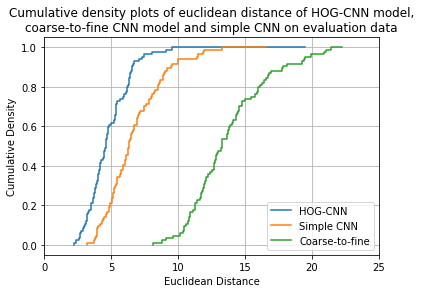

In [51]:
# CDP

#Get the data of the coarse-to-fine model
file_name = 'euclid_test_coarsetofine_cnn.csv'
with open(file_name, newline='') as f:
  reader = csv.reader(f)
  data_full = list(reader)

  data_ctf = []
  for i in range(len(data_full)):
    data_ctf.append(data_full[i][0])
  data_ctf = np.array(data_ctf).astype(float)

#Get the data for the simple CNN
file_name = 'euclid_test_cnn_no_hog_gray.csv'
with open(file_name, newline='') as f:
  reader = csv.reader(f)
  data_full = list(reader)

  data_simpleCNN = []
  for i in range(len(data_full)):
    data_simpleCNN.append(data_full[i][0])
  data_simpleCNN = np.array(data_simpleCNN).astype(float)

#Make data list for CDP
data = [evaluation_dataset_individual_ed, data_simpleCNN, data_ctf]

for data_item in data:
  plt.step(np.sort(data_item),np.linspace(0,1,len(data_item)))

plt.title('Cumulative density plots of euclidean distance of HOG-CNN model,\ncoarse-to-fine CNN model and simple CNN on evaluation data')
plt.ylabel('Cumulative Density')
plt.xlabel('Euclidean Distance')
plt.xlim([0, 25])
plt.legend(['HOG-CNN', 'Simple CNN','Coarse-to-fine'], loc='lower right')
plt.grid()
plt.show()

On the CDP it is clear that the HOG-CNN does better than our other two models. Its line seems to stay more on the left, indicating that it has a lower euclidean distance for more images than the simple CNN (same CNN model but without the HOG features) and the coarse-to-fine model.

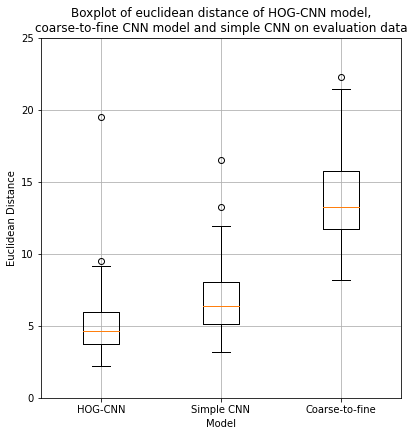

In [52]:
fig = plt.figure(figsize =(5, 5)) 
ax = fig.add_axes([0, 0, 1, 1]) 
bp = ax.boxplot([data[i] for i in range(len(data))]) 
plt.title('Boxplot of euclidean distance of HOG-CNN model,\ncoarse-to-fine CNN model and simple CNN on evaluation data') 
plt.ylabel('Euclidean Distance') 
plt.xlabel('Model') 
plt.ylim([0, 25])
ax.set_xticklabels(['HOG-CNN','Simple CNN','Coarse-to-fine']) 
plt.grid() 
plt.show()

Again, it is clear here that the HOG-CNN model performs better than the other two models we implemented. Although the simple CNN isn't as good as the HOG-CNN it is still quite closer, and in the two graphs we can see it is always much closer to the HOG-CNN than the coarse-to-fine model.

2.6.2 Comparing our model to other HOG parameters

We build (in other notebooks) the exact same model but with different HOG parameters, specificially the number of pixels per cell were changed. This is how we found that 6x6 pixels per cell gave us the best results on our HOG-CNN model. We gathered their euclidean distance on each evaluation image and plot them here in a CDP and a BP.

In this notebook, we imported the results of our other models, but not the actual models as they would take up too much of our RAM space and make our notebook crash.

In [53]:
data_sets = [2,4,6,8,10,12,14]
data = []

for num in data_sets:
  file_name = 'euclid_test_cnn_hog_' + str(num) + '.csv'

  with open(file_name, newline='') as f:
    reader = csv.reader(f)
    data_full = list(reader)

  data_add = []
  for i in range(len(data_full)):
    data_add.append(data_full[i][0])
  data_add = np.array(data_add).astype(float)

  data.append(data_add)

data = np.array(data)

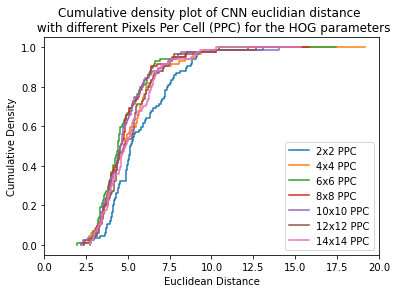

In [54]:
for data_item in data:
  plt.step(np.sort(data_item),np.linspace(0,1,len(data_item)))

plt.title('Cumulative density plot of CNN euclidian distance \n with different Pixels Per Cell (PPC) for the HOG parameters')
plt.ylabel('Cumulative Density')
plt.xlabel('Euclidean Distance')
plt.xlim([0, 20])
plt.legend(['2x2 PPC','4x4 PPC','6x6 PPC','8x8 PPC','10x10 PPC','12x12 PPC','14x14 PPC','16x16 PPC'], loc='lower right')
plt.show()

#plt.grid()  

Here we can observe that the green line that represents the 6x6 PPC model does mostly outperform the other models but the 8x8 and 10x10 sometimes surpass it. The 2x2 model is the observable worst one in terms of performance.

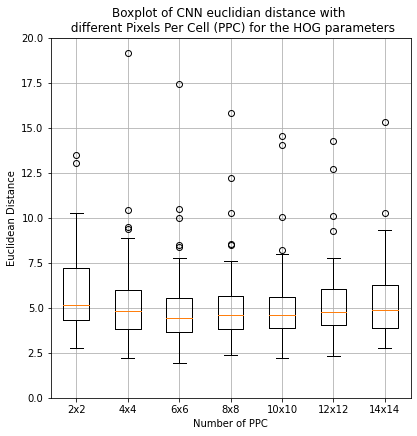

In [55]:
fig = plt.figure(figsize =(5, 5)) 
ax = fig.add_axes([0, 0, 1, 1]) 
bp = ax.boxplot([data[i] for i in range(len(data))]) 
plt.title('Boxplot of CNN euclidian distance with \n different Pixels Per Cell (PPC) for the HOG parameters') 
plt.ylabel('Euclidean Distance') 
plt.xlabel('Number of PPC') 
plt.ylim([0, 20])
ax.set_xticklabels(['2x2','4x4','6x6','8x8','10x10','12x12','14x14','16x16']) 
plt.grid() 
plt.show()

In this box plot, we can see that the 6x6, 8x8 and 10x10 models have averages that outperform the other models in terms of average Euclidean distance on the evaluation dataset. More precisely, the 6x6 model outperforms all of them in terms of average (only slightly) and has a lower minimum than any other model. This is why we train our model on 6x6 PPC for the HOG parameter.

2.6.3 Comparing our model to the same model with a ReLU activation layer

It seems logical to have our output layer have the ReLU activation function since the points we need can only be correct if they're above zero and linear. But through experimentation, we've found that a Sigmoid activation function on the output layer improves it.

In [56]:
# Defining a model that is the exact same as before but with a ReLU activation function on the output layer

def build_CNN_ReLU_output():
  model = Sequential()

  model = Sequential()
  model.add(Conv2D(128, (3, 3), padding = 'same', activation='relu', input_shape=(122, 122, 1)))

  model.add(MaxPool2D(pool_size=(2, 2)))

  model.add(Dropout(0.25))
  model.add(Flatten())
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.25))
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.25))
  model.add(Dense(256, activation='relu'))

  model.add(Dropout(0.5))
  model.add(Dense(84, activation='relu'))

  model.compile(loss='mean_squared_error', optimizer='adam')

  return model

CNN_model_ReLU_output = build_CNN_ReLU_output()

#Training the CNN
CNN_model_ReLU_output = train_CNN(CNN_model_ReLU_output, train_generator, validation_generator, num_epochs=100)

Training the model...
Epoch 1/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0688 - val_loss: 0.0031
Epoch 2/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0097 - val_loss: 0.0027
Epoch 3/100
170/170 [==============================] - 23s 133ms/step - loss: 0.0071 - val_loss: 0.0020
Epoch 4/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0057 - val_loss: 0.0018
Epoch 5/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0049 - val_loss: 0.0015
Epoch 6/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0043 - val_loss: 0.0015
Epoch 7/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0037 - val_loss: 0.0014
Epoch 8/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0033 - val_loss: 0.0014
Epoch 9/100
170/170 [==============================] - 23s 134ms/step - loss: 0.0030 - val_loss: 0.0015
Epoch 10/100
170/170 [====================

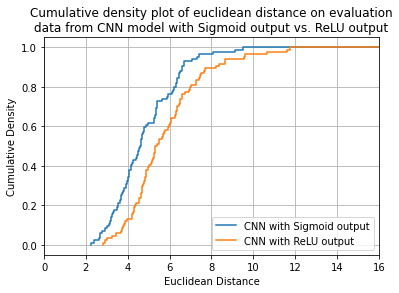

In [57]:
#Evaluate that CNN against our model with the Sigmoid activation function on the output layer

#Make the predictions and store them in a list
evaluation_dataset_individual_ed_ReLU_output = [get_avg_euclid_dist(get_predictions(img,CNN_model_ReLU_output),pts_gt) for img,pts_gt in evaluation_data]

#Make data list for CDP
data = [evaluation_dataset_individual_ed, evaluation_dataset_individual_ed_ReLU_output]

for data_item in data:
  plt.step(np.sort(data_item),np.linspace(0,1,len(data_item)))

plt.title('Cumulative density plot of euclidean distance on evaluation\ndata from CNN model with Sigmoid output vs. ReLU output')
plt.ylabel('Cumulative Density')
plt.xlabel('Euclidean Distance')
plt.xlim([0, 16])
plt.legend(['CNN with Sigmoid output', 'CNN with ReLU output'], loc='lower right')
plt.grid()
plt.show()

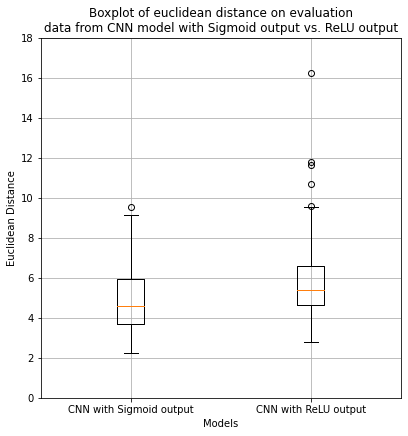

In [58]:
fig = plt.figure(figsize =(5, 5)) 
ax = fig.add_axes([0, 0, 1, 1]) 
bp = ax.boxplot([data[i] for i in range(len(data))]) 
plt.title('Boxplot of euclidean distance on evaluation\ndata from CNN model with Sigmoid output vs. ReLU output')
plt.ylabel('Euclidean Distance') 
plt.xlabel('Models') 
plt.ylim([0, 18])
ax.set_xticklabels(['CNN with Sigmoid output', 'CNN with ReLU output']) 
plt.grid() 
plt.show()

With the same training data and CNN architecture with only the activation function of the output layer changing, the two models perform differently. Seeing the CDP that plots their average Euclidean distance for each image of the evaluation set, we can determine that our model performs better if the activation function of the output layer is Sigmoid, even if in theory ReLU makes more sense.

##3. Colouring face landmarks: lips and eyes

In this section, we are changing the colour of the lips of the images of faces and the irises. We were able to get realistic results for the lips but not for the eyes. We will describe and go through our method for both tasks of colouring the face landmarks and showing qualitative results.

###3.1 Changing the colour of the lips

3.1.1 Method

Our method is the following:
1. Use our HOG-CNN model to predict the points of the inner lip and outer lip
2. Use these points to create a polygon that we'll extract from a picture of the face. We now have a picture of the face without the lips.
3. Make a copy of the original image and colour it into the colour we want the lips to be. Use the same polygon to extract the lips from that image. We now have the image of the lips coloured without the face.
4. Add the two images together.

We add a few more transformations to our polygon of the lips and the way we colour the lips:
- the polygon is made of the outer lip points and subtracted by the inner lip points so that the inside of the mouth is excluded (this is very useful if the mouth is open)
- the polygon has a closing transformation applied to make sure there are no holes in case of some mispredicted points
- the polygon has a blurring transformation applied to make it go over the lips a little (as lipstick colouring would realistically) and help the colouring application keep the texture of the face
- the colour types are colour-maps meaning they are gradients, providing more realistic results (as lipstick is often not of the same colour intensity over the entire lips) and helping blend in with the texture.

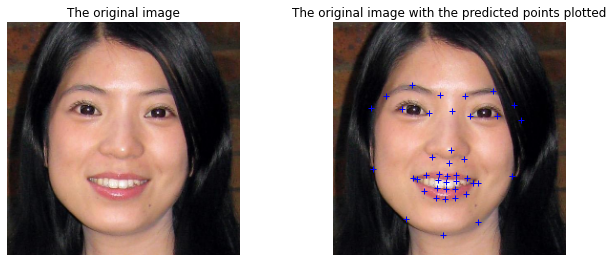

In [60]:
#Here is the image from our evaluation set that we will use to walkthrough the steps of our method

image = np.copy(evaluation_data[69][0]) # should choose one with open mouth
pred_pts = np.reshape(get_predictions(image, CNN_model), (42,2)) #predict the points

fig = plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.gca().set_title('The original image')
plt.axis('off')
plt.imshow(image)

plt.subplot(122)
plt.gca().set_title('The original image with the predicted points plotted')
plt.axis('off')
plt.imshow(image)
plt.plot(pred_pts[:,0],pred_pts[:,1],'+b')

# set the spacing between subplots
plt.subplots_adjust(wspace=0.4)
plt.show()

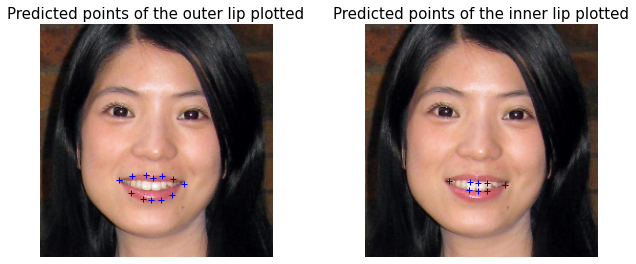

In [61]:
#First lets find the lips

outerlip_points = []
for i in range(22,34):
  outerlip_points.append(pred_pts[i])
outerlip_points = np.array([outerlip_points], dtype=np.int32)
outerlip_points_for_plot = np.reshape(outerlip_points,(12,2))

fig = plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.gca().set_title('Predicted points of the outer lip plotted',fontsize=15)
plt.imshow(image)
plt.axis('off')
plt.plot(outerlip_points_for_plot[:,0],outerlip_points_for_plot[:,1],'+b')

innerlip_points = []
for i in range(34,42):
  innerlip_points.append(pred_pts[i])
innerlip_points = np.array([innerlip_points], dtype=np.int32)
innerlip_points_for_plot = np.reshape(innerlip_points,(8,2))

plt.subplot(122)
plt.gca().set_title('Predicted points of the inner lip plotted',fontsize=15)
plt.imshow(image)
plt.axis('off')
plt.plot(innerlip_points_for_plot[:,0],innerlip_points_for_plot[:,1],'+b')

plt.subplots_adjust(wspace=0.4)
plt.show()

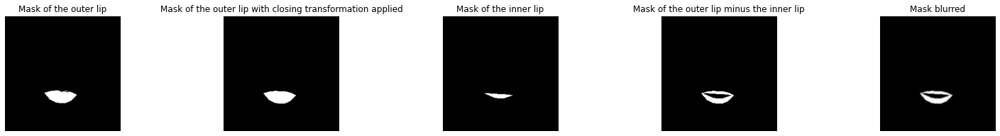

In [62]:
#Make a mask for the lips we want to color
#We need to close the holes in the mask
#We need to exclude the inner lips from the mask

outerlip_mask = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.float32)
cv2.fillConvexPoly(outerlip_mask, outerlip_points, (1.0, 1.0, 1.0))
outerlip_mask = 255*np.uint8(outerlip_mask)

fig = plt.figure(figsize=(25, 25))
plt.subplot(151)
plt.gca().set_title('Mask of the outer lip')
plt.axis('off')
plt.imshow(outerlip_mask)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,40)) #fill in the holes in the mask
outerlip_mask = cv2.morphologyEx(outerlip_mask, cv2.MORPH_CLOSE, kernel, 1)

plt.subplot(152)
plt.gca().set_title('Mask of the outer lip with closing transformation applied')
plt.axis('off')
plt.imshow(outerlip_mask)

innerlip_mask = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.float32)
cv2.fillConvexPoly(innerlip_mask, innerlip_points, (1.0, 1.0, 1.0))
innerlip_mask = 255*np.uint8(innerlip_mask)

plt.subplot(153)
plt.gca().set_title('Mask of the inner lip')
plt.axis('off')
plt.imshow(innerlip_mask)

mask = outerlip_mask - innerlip_mask

plt.subplot(154)
plt.gca().set_title('Mask of the outer lip minus the inner lip')
plt.axis('off')
plt.imshow(mask)

mask = cv2.GaussianBlur(mask,(3,3),cv2.BORDER_DEFAULT)

plt.subplot(155)
plt.gca().set_title('Mask blurred')
plt.axis('off')
plt.imshow(mask)

plt.subplots_adjust(wspace=0.9)
plt.show()

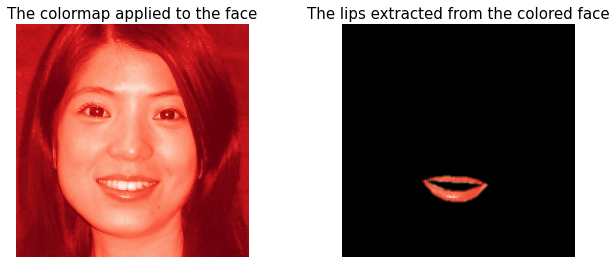

In [63]:
#Color in the original image and extract the lips
face_copy = np.copy(image)

face_colored = cv2.applyColorMap(face_copy, cmapy.cmap('Reds_r') )
face_colored = cv2.cvtColor(face_colored, cv2.COLOR_BGR2RGB)
face_colored = face_colored.astype(float)/255 #normalise it

fig = plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.gca().set_title('The colormap applied to the face',fontsize=15)
plt.axis('off')
plt.imshow(face_colored)

mask_norm = mask.astype(float)/255
only_lips_colored = cv2.multiply(mask_norm, face_colored) #remove the entire face except the lips

plt.subplot(122)
plt.gca().set_title('The lips extracted from the colored face',fontsize=15)
plt.axis('off')
plt.imshow(only_lips_colored)

plt.subplots_adjust(wspace=0.4)
plt.show()

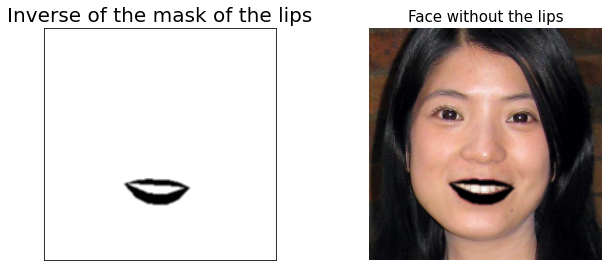

In [64]:
#Make a copy of the original image without the lips
#First need to make an inverse of the mask

inverse_mask = cv2.bitwise_not(mask)


fig = plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.gca().set_title('Inverse of the mask of the lips',fontsize=20)
plt.xticks([],[])
plt.yticks([],[])
plt.imshow(inverse_mask)


face_copy = np.copy(image)
face_copy = face_copy.astype(float)/255
inverse_mask = inverse_mask.astype(float)/255
face_no_lips = cv2.multiply(inverse_mask, face_copy) # applying the inverse mask on the image of the face
 #normalising


plt.subplot(122)
plt.gca().set_title('Face without the lips',fontsize=15)
plt.axis('off')
plt.imshow(face_no_lips)

plt.subplots_adjust(wspace=0.4)
plt.show()

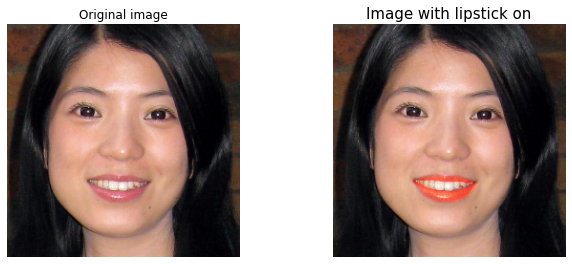

In [65]:
#Now we can blend the image without the lips and the image with only the lips colored together

colored_lips_on_face = only_lips_colored + face_no_lips

fig = plt.figure(figsize=(10, 10))

plt.subplot(121)
plt.gca().set_title('Original image')
plt.axis('off')
plt.imshow(image)

plt.subplot(122)
plt.gca().set_title('Image with lipstick on',fontsize=15)
plt.axis('off')
plt.imshow(colored_lips_on_face)

plt.subplots_adjust(wspace=0.4)
plt.show()

In [66]:
#The function

#General method
  #1. Get face and take out the lips
  #2. Get face, color it and take out everything but the lips
  #3. Add the face without the lips and the colored lips

def color_lips(img, pts, color='blue'):  
  if color == 'red': colormap = cmapy.cmap('Reds_r')
  elif color == 'green': colormap = cmapy.cmap('Greens_r')
  elif color == 'purple': colormap = cmapy.cmap('Purples_r')
  elif color == 'blue': colormap = cmapy.cmap('Blues_r')

  #Find the lips
  outerlip_points = []
  for i in range(22,34):
    outerlip_points.append(pts[i])
  outerlip_points = np.array([outerlip_points], dtype=np.int32)

  innerlip_points = []
  for i in range(34,42):
    innerlip_points.append(pts[i])
  innerlip_points = np.array([innerlip_points], dtype=np.int32)


  #Get the face and take out the lips
  #Get the face
  face_copy = np.copy(img)
  face_copy = img.astype(float)/255 #normalise it
  #With the lip points, create a lip mask and invert it to extract face without lips

  outerlip_mask = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.float32)
  cv2.fillConvexPoly(outerlip_mask, outerlip_points, (1.0, 1.0, 1.0))
  outerlip_mask = 255*np.uint8(outerlip_mask)

  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,40)) #fill in the holes in the mask
  outerlip_mask = cv2.morphologyEx(outerlip_mask, cv2.MORPH_CLOSE, kernel, 1)

  innerlip_mask = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.float32)
  cv2.fillConvexPoly(innerlip_mask, innerlip_points, (1.0, 1.0, 1.0))
  innerlip_mask = 255*np.uint8(innerlip_mask)

  mask = outerlip_mask - innerlip_mask

  mask = cv2.GaussianBlur(mask,(3,3),cv2.BORDER_DEFAULT) #blurring mask makes it a little more realistic
  #outerlip_mask = outerlip_mask.astype(float)/255

  inverse_mask = cv2.bitwise_not(mask)
  inverse_mask = inverse_mask.astype(float)/255 #normalise it

  face_no_lips = cv2.multiply(inverse_mask, face_copy)
  

  #Get the face, color it and extract the lips (remove everythig but the lips)
  #Get the face
  face_copy = np.copy(img)

  #face_gray = cv2.cvtColor(face_copy, cv2.COLOR_BGR2GRAY)

  face_colored = cv2.applyColorMap(face_copy, colormap)
  #face_colored = cv2.applyColorMap(face_copy, cmap )
  face_colored = cv2.cvtColor(face_colored, cv2.COLOR_BGR2RGB)
  
  face_colored = face_colored.astype(float)/255 #normalise it

  mask = mask.astype(float)/255
  
  only_lips_colored = cv2.multiply(mask, face_colored) #remove the entire face except the lips
  

  colored_lips_on_face = only_lips_colored + face_no_lips
  #colored_lips_on_face = matched + face_no_lips

  

  return colored_lips_on_face

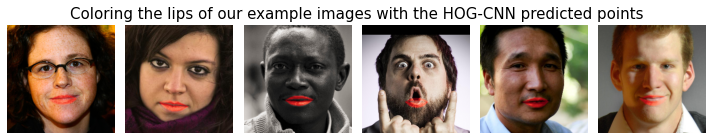

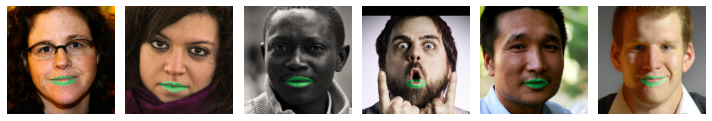

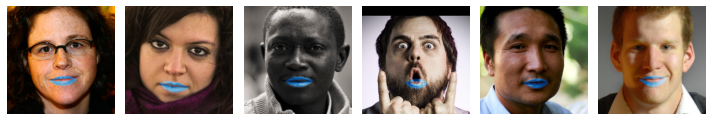

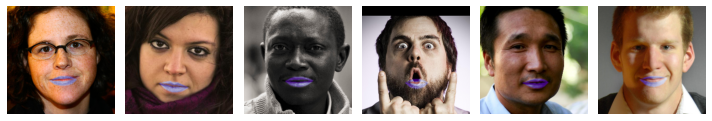

In [67]:
images = np.copy(example_images)
predicted_points = [np.reshape(get_predictions(image, CNN_model), (42,2)) for image in images]

fig = plt.figure(figsize=(10, 10))
for i in range(len(images)):
  ax = fig.add_subplot(161+i)
  img_with_lipstick = color_lips(images[i], predicted_points[i], color='red')
  ax.imshow(img_with_lipstick)
  plt.axis('off')

fig.tight_layout()
fig.suptitle('Coloring the lips of our example images with the HOG-CNN predicted points',y=0.6,fontsize=15)
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(images)):
  ax = fig.add_subplot(161+i)
  img_with_lipstick = color_lips(images[i], predicted_points[i], color='green')
  ax.imshow(img_with_lipstick)
  plt.axis('off')

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(images)):
  ax = fig.add_subplot(161+i)
  img_with_lipstick = color_lips(images[i], predicted_points[i], color='blue')
  ax.imshow(img_with_lipstick)
  plt.axis('off')

fig.tight_layout()
plt.show()

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(10, 10))
for i in range(len(images)):
  ax = fig.add_subplot(161+i)
  img_with_lipstick = color_lips(images[i], predicted_points[i], color='purple')
  ax.imshow(img_with_lipstick)
  plt.axis('off')

fig.tight_layout()
plt.show()

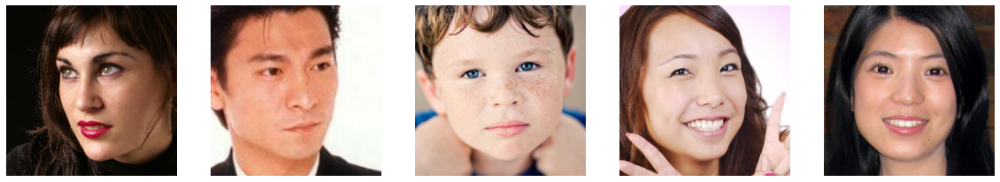

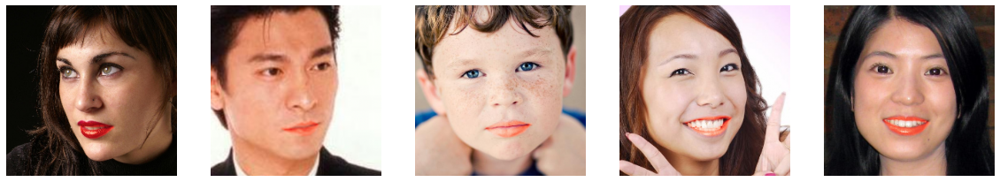

In [86]:
# Show 6 images from evaluation set where its good
from matplotlib import gridspec

to_show = [2,7,9,17, 20,28,39,40, 44, 47, 49, 50, 52, 53, 58, 60, 62, 67, 68, 69, 72, 75, 76, 78, 79, 82]

to_show = [9, 40, 44, 49, 69]
fig = plt.figure(figsize=(20,20))

for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  plt.subplot(151+i)
  plt.axis('off')
  plt.imshow(img)
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  predicted_points = np.reshape(get_predictions(img, CNN_model),(42,2))

  img_with_lipstick = color_lips(img, predicted_points, color='red')
  plt.subplot(151+i)
  plt.axis('off')
  plt.imshow(img_with_lipstick)
plt.show()


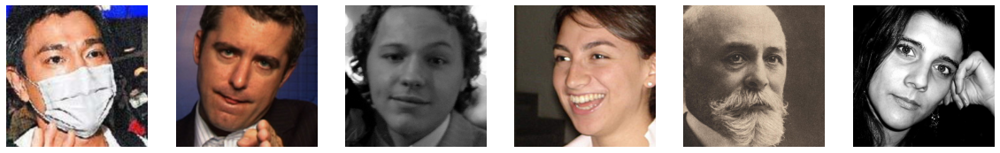

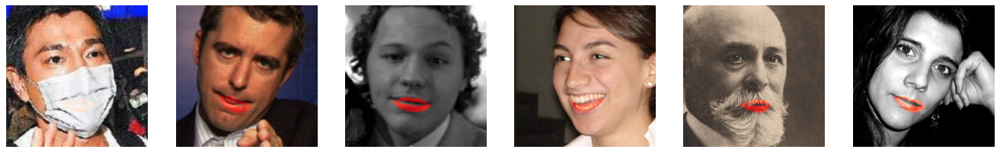

In [89]:
# Show 6 images from evaluation set where its not realistic with the predicted points
to_show = [5,11,23,30, 73, 84]

fig = plt.figure(figsize=(20,20))

for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  plt.subplot(161+i)
  plt.axis('off')
  plt.imshow(img)
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  predicted_points = np.reshape(get_predictions(img, CNN_model),(42,2))

  img_with_lipstick = color_lips(img, predicted_points, color='red')
  plt.subplot(161+i)
  plt.axis('off')
  plt.imshow(img_with_lipstick)

plt.show()

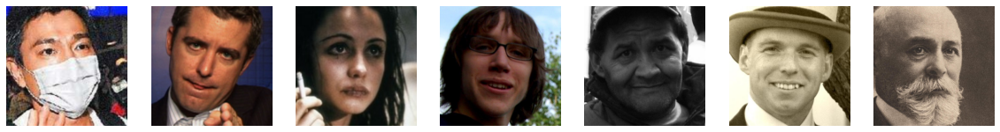

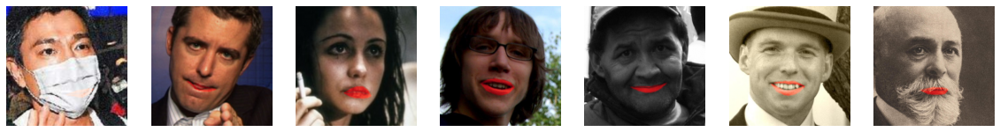

In [88]:
# Show 7 images from evaluation set where its not realistic with the groundtruth points
to_show = [5, 11, 20, 31, 38, 55, 73]

fig = plt.figure(figsize=(20,20))

for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  plt.subplot(171+i)
  plt.axis('off')
  plt.imshow(img)
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  points = evaluation_data[to_show[i]][1]

  img_with_lipstick = color_lips(img, points, color='red')
  plt.subplot(171+i)
  plt.axis('off')
  plt.imshow(img_with_lipstick)

plt.show()

###3.2 Changing the colour of the eyes (the irises)

Our method:
1. Predict the face alignment points
2. Use the aligned eye predicted points to crop out each eye (as a square image)
3. Blur and binarise the eye crops and pass them through a circle finding function to find where the irises are
4. On the original image, apply a colour-map only in the found circles of the irises

Our method produced non-realistic results from not always finding the iris: in failure cases, our circle finding function (HoughCircles) either returned nothing or another part around the iris that was not the iris.

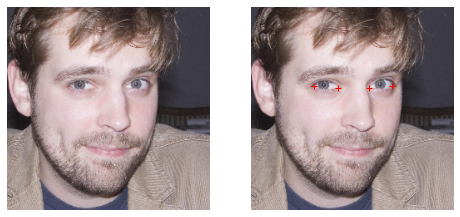

In [71]:
img = train_data[2][0]
pts = train_data[2][1]
fig = plt.figure(figsize=(8,8))
plt.subplot(121)
plt.axis('off')
plt.imshow(img)

plt.subplot(122)
plt.axis('off')
plt.imshow(img)
plt.plot(pts[:,0][18],pts[:,1][18],'+r')
plt.plot(pts[:,0][19],pts[:,1][19],'+r')
plt.plot(pts[:,0][20],pts[:,1][20],'+r')
plt.plot(pts[:,0][21],pts[:,1][21],'+r')
plt.show()

In [72]:
def getEyeCrop(img, pts):
    # get coordinates of center of eye
    left_eye_left = pts[0]
    left_eye_right = pts[1]
    left_eye_center = [(left_eye_right[0] + left_eye_left[0]) / 2, (left_eye_right[1] + left_eye_left[1]) / 2]

    # get the width of the box
    left_eye_right_x = left_eye_right[0]
    left_eye_center_x = left_eye_center[0]
    box_width = (left_eye_right_x-left_eye_center_x)*2
    
    # make the mask
    mask = np.zeros(img.shape[:2], dtype="uint8")
    top_left_corner = (round(left_eye_center[0]-(box_width/2)), round(left_eye_center[1]-(box_width/2)))
    bottom_right_corner = (round(left_eye_center[0]+(box_width/2)), round(left_eye_center[1]+(box_width/2)))
    cv2.rectangle(mask, top_left_corner, bottom_right_corner, 255, -1)

    masked = cv2.bitwise_and(img, img, mask=mask)
    
    masked = masked[top_left_corner[1]:round(top_left_corner[1]+box_width),top_left_corner[0]:round(top_left_corner[0]+box_width)]
  
    return masked, top_left_corner

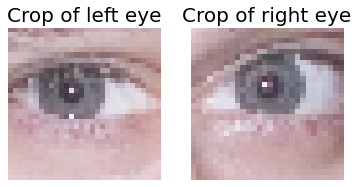

In [73]:
left_eye_pts = (pts[18],pts[19])
left_eye_crop = getEyeCrop(img,left_eye_pts)
plt.subplot(121)
plt.gca().set_title('Crop of left eye', fontsize=20)
plt.axis('off')
plt.imshow(left_eye_crop[0])

right_eye_pts = (pts[20],pts[21])
right_eye_crop = getEyeCrop(img,right_eye_pts)
plt.subplot(122)
plt.gca().set_title('Crop of right eye', fontsize=20)
plt.axis('off')
plt.imshow(right_eye_crop[0])
plt.show()

In [74]:
def getEyeCircle(eye_crop,top_left_corner):
  eye_crop_gray = cv2.cvtColor(eye_crop,cv2.COLOR_BGR2GRAY)
  median = cv2.medianBlur(eye_crop_gray,3)

  ret, thresh = cv2.threshold(median,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  copy = thresh.copy()

  im2, contours = cv2.findContours(copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  height, width, channels = eye_crop.shape

  rows = eye_crop_gray.shape[0]
  circles = cv2.HoughCircles(eye_crop_gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                                param1=30, param2=15,
                                minRadius=0, maxRadius=0)
  
  drawing = np.copy(eye_crop)
  cv2.circle(drawing,(circles[0][0][0],circles[0][0][1]),circles[0][0][2],(255, 255, 255),-1)

  circle_xyr = (circles[0][0][0],circles[0][0][1],circles[0][0][2])
  circle_uncropped = (round(circles[0][0][0]+top_left_corner[0]),round(circles[0][0][1]+top_left_corner[1]),round(circles[0][0][2]))
  
  return circle_uncropped

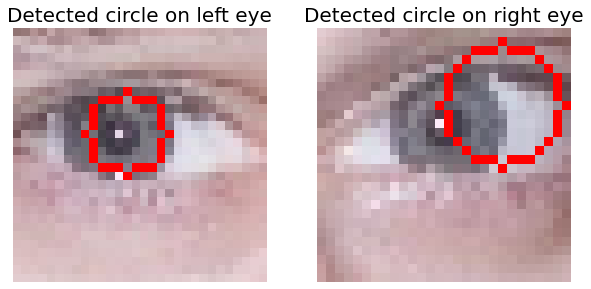

In [75]:
#Getting the circle for the eyes

eye_crop_gray = cv2.cvtColor(left_eye_crop[0],cv2.COLOR_BGR2GRAY)
median = cv2.medianBlur(eye_crop_gray,3)
ret, thresh = cv2.threshold(median,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
copy = thresh.copy()

im2, contours = cv2.findContours(copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
height, width= eye_crop_gray.shape

rows = eye_crop_gray.shape[0]
circles = cv2.HoughCircles(eye_crop_gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                              param1=30, param2=15,
                              minRadius=0, maxRadius=0)
circle_xyr = (circles[0][0][0],circles[0][0][1],circles[0][0][2])
left_eye_circle = circle_xyr
figure = plt.figure(figsize=(10,10))
plt.subplot(121)
plt.gca().set_title('Detected circle on left eye', fontsize=20)
cv2.circle(left_eye_crop[0], center=(left_eye_circle[0],left_eye_circle[1]), radius = left_eye_circle[2],color =(255,0,0))
plt.axis('off')
plt.imshow(left_eye_crop[0])


eye_crop_gray = cv2.cvtColor(right_eye_crop[0],cv2.COLOR_BGR2GRAY)
median = cv2.medianBlur(eye_crop_gray,3)
ret, thresh = cv2.threshold(median,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
copy = thresh.copy()

im2, contours = cv2.findContours(copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
height, width= eye_crop_gray.shape

rows = eye_crop_gray.shape[0]
circles = cv2.HoughCircles(eye_crop_gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                              param1=30, param2=15,
                              minRadius=0, maxRadius=0)
circle_xyr = (circles[0][0][0],circles[0][0][1],circles[0][0][2])
right_eye_circle = circle_xyr
plt.subplot(122)
plt.gca().set_title('Detected circle on right eye', fontsize=20)
cv2.circle(right_eye_crop[0], center=(right_eye_circle[0],right_eye_circle[1]), radius = right_eye_circle[2],color =(255,0,0))
plt.axis('off')
plt.imshow(right_eye_crop[0])


plt.show()

In [76]:
def get_iris_mask(img,points):
  left_eye_pts = (points[18],points[19])
  left_eye_crop, left_eye_top_left_corner = getEyeCrop(img,left_eye_pts)
  left_eye_circle = getEyeCircle(left_eye_crop,left_eye_top_left_corner)

  left_iris_mask = np.zeros(img.shape, dtype="uint8")
  cv2.circle(left_iris_mask, (left_eye_circle[0],left_eye_circle[1]), left_eye_circle[2], (255, 255, 255), -1)

  left_iris_mask_inv = np.ones(img.shape, dtype="uint8")*255
  cv2.circle(left_iris_mask_inv, (left_eye_circle[0],left_eye_circle[1]), left_eye_circle[2], 0, -1)



  right_eye_pts = (points[20],points[21])
  right_eye_crop, right_eye_top_left_corner = getEyeCrop(img,right_eye_pts)
  right_eye_circle = getEyeCircle(right_eye_crop,right_eye_top_left_corner)

  right_iris_mask =  np.zeros_like(img)
  cv2.circle(right_iris_mask, (right_eye_circle[0],right_eye_circle[1]), right_eye_circle[2], (255, 255, 255), -1)

  right_iris_mask_inv = np.ones_like(img)*255
  cv2.circle(right_iris_mask_inv, (right_eye_circle[0],right_eye_circle[1]), right_eye_circle[2], 0, -1)

  return left_iris_mask,left_iris_mask_inv, right_iris_mask, right_iris_mask_inv


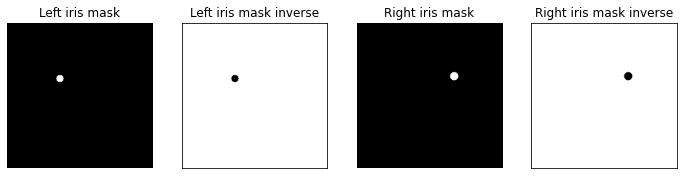

In [77]:
left_iris_mask,left_iris_mask_inv, right_iris_mask, right_iris_mask_inv = get_iris_mask(img, pts)

figure = plt.figure(figsize=(12,12))

plt.subplot(141)
plt.gca().set_title('Left iris mask')
plt.axis('off')
plt.imshow(left_iris_mask)

plt.subplot(142)
plt.gca().set_title('Left iris mask inverse')
plt.xticks([],[])
plt.yticks([],[])
plt.imshow(left_iris_mask_inv)

plt.subplot(143)
plt.gca().set_title('Right iris mask')
plt.axis('off')
plt.imshow(right_iris_mask)

plt.subplot(144)
plt.gca().set_title('Right iris mask inverse')
plt.xticks([],[])
plt.yticks([],[])
plt.imshow(right_iris_mask_inv)

plt.show()

In [78]:
def changeEyeColor(im, irisMask, inverseIrisMask):
    imCopy = cv2.applyColorMap(im, cmapy.cmap("Greens_r"))

    imCopy = imCopy.astype(float)/255
    irisMask = irisMask.astype(float)/255
    inverseIrisMask = inverseIrisMask.astype(float)/255
    im = im.astype(float)/255

    faceWithoutEye = cv2.multiply(inverseIrisMask, im)

    newIris = cv2.multiply(irisMask, imCopy)

    result = faceWithoutEye + newIris
    return result

def float642Uint8(im):
    im2Convert = im.astype(np.float64) / np.amax(im)
    im2Convert = 255 * im2Convert 
    convertedIm = im2Convert.astype(np.uint8)
    return convertedIm

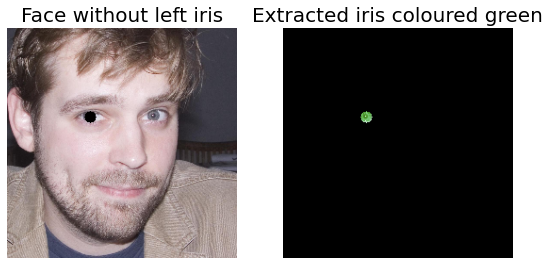

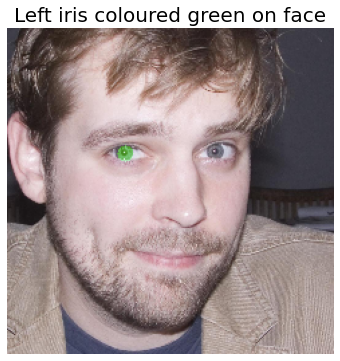

In [79]:
imCopy = cv2.applyColorMap(img, cmapy.cmap("Greens_r"))

imCopy = imCopy.astype(float)/255
irisMask = left_iris_mask.astype(float)/255
inverseIrisMask = left_iris_mask_inv.astype(float)/255
img = img.astype(float)/255

fig = plt.figure(figsize=(14,14))

faceWithoutEye = cv2.multiply(inverseIrisMask, img)
plt.subplot(131)
plt.gca().set_title('Face without left iris', fontsize=20)
plt.axis('off')
plt.imshow(faceWithoutEye)

newIris = cv2.multiply(irisMask, imCopy)

plt.subplot(132)
plt.gca().set_title('Extracted iris coloured green',fontsize=20)
plt.axis('off')
plt.imshow(newIris)
plt.show()

result = faceWithoutEye + newIris

fig = plt.figure(figsize=(6,6))
plt.title('Left iris coloured green on face',fontsize=20)
plt.axis('off')
plt.imshow(result)
plt.show()

In [80]:
# Function that does all of that for us

def change_irises_color(img):
  pts = np.reshape(get_predictions(img, CNN_model),(42,2))

  left_eye_pts = (pts[18],pts[19])
  left_eye_crop = getEyeCrop(img,left_eye_pts)

  right_eye_pts = (pts[20],pts[21])
  right_eye_crop = getEyeCrop(img,right_eye_pts)

  left_eye_circle = getEyeCircle(left_eye_crop[0], left_eye_crop[1])
  right_eye_circe = getEyeCircle(right_eye_crop[0], right_eye_crop[1])

  left_iris_mask,left_iris_mask_inv, right_iris_mask, right_iris_mask_inv = get_iris_mask(img, pts)

  result = changeEyeColor(img, left_iris_mask, left_iris_mask_inv)
  result = float642Uint8(result)
  result = changeEyeColor(result, right_iris_mask, right_iris_mask_inv)

  return result

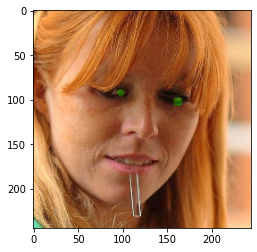

In [91]:
#Plotting the result from our method on an image from our evaluation dataset

img = evaluation_data[17][0]

img_irises_changed = change_irises_color(img)

plt.imshow(img_irises_changed)
plt.show()

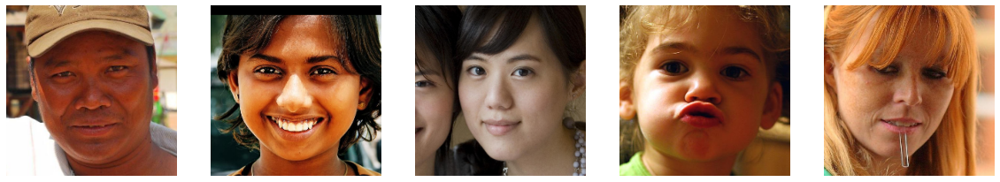

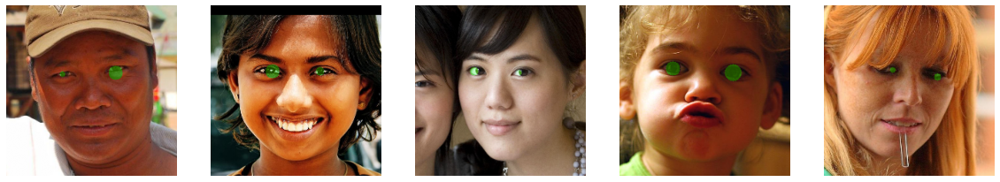

In [92]:
# Showing results on images where circles were found, even if they are not always the irises

to_show = [2,6,8,15,17]

fig = plt.figure(figsize=(20,20))

for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]
  plt.subplot(151+i)
  plt.axis('off')
  plt.imshow(img)
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(len(to_show)):
  img = evaluation_data[to_show[i]][0]

  img_with_irises_changed = change_irises_color(img)
  plt.subplot(151+i)
  plt.axis('off')
  plt.imshow(img_with_irises_changed)

plt.show()